In [1]:
# 自作モジュールをインポートするためのパスを追加
import sys
sys.path.append('../src')
import torch
from torch.utils.data import DataLoader, Subset
import numpy as np
import patchcore.backbones
import patchcore.common
import patchcore.patchcore
import patchcore.sampler
import patchcore.metrics

from patchcore.datasets import mvtec

In [2]:
# 設定
gpu = [0]
input_shape = (3, 224, 224)  # 例として画像の形状を設定
backbone_name = "wideresnet50"  # 使用するバックボーン名
layers_to_extract_from = ["layer2", "layer3"]  # 特徴を抽出する層
pretrain_embed_dimension = 1024 # 事前学習の埋め込み次元
target_embed_dimension = 1024 # ターゲットの埋め込み次元
patchsize = 3 # パッチサイズ
anomaly_scorer_num_nn = 1 # 異常スコアリング時の最近傍数。kNNのk
faiss_on_gpu = False # faissをGPUで動かすかどうか。faissとは、高速な類似度検索を行うライブラリ
faiss_num_workers = 8 # faissのワーカー数
percentage = 0.1  # サンプラーの割合

# デバイスの設定
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# サンプラーの取得
sampler = patchcore.sampler.GreedyCoresetSampler(percentage, device)
# PatchCoreの設定
backbone = patchcore.backbones.load(backbone_name)
nn_method = patchcore.common.FaissNN(faiss_on_gpu, faiss_num_workers)

patchcore_instance = patchcore.patchcore.PatchCore(device)
patchcore_instance.load(
    backbone=backbone,
    layers_to_extract_from=layers_to_extract_from,
    device=device,
    input_shape=input_shape,
    pretrain_embed_dimension=pretrain_embed_dimension,
    target_embed_dimension=target_embed_dimension,
    patchsize=patchsize,
    featuresampler=sampler,
    anomaly_scorer_num_nn=anomaly_scorer_num_nn,
    nn_method=nn_method,
)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Wide_ResNet50_2_Weights.IMAGENET1K_V1`. You can also use `weights=Wide_ResNet50_2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
# データセットのパス
data_path = '../../../data_d/mvtec'
# データセットの作成
train_dataset = mvtec.MVTecDataset(
    source=data_path,
    classname='pill',
    resize=256,
    imagesize=224,
    split=mvtec.DatasetSplit.TRAIN,  # トレーニングデータを指定
)

test_dataset = mvtec.MVTecDataset(
    source=data_path,
    classname='pill',
    resize=256,
    imagesize=224,
    split=mvtec.DatasetSplit.TEST,  # テストデータを指定
)

# データローダーの作成
batch_size = 16  # バッチサイズを指定
num_workers = 1  # データローディングのためのワーカースレッド数を指定

train_dataloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,  # トレーニングデータをシャッフル
    num_workers=num_workers,
    pin_memory=True
)

test_dataloader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=True, # 正常と異常の差を確認するためにシャッフル
    num_workers=num_workers,
    pin_memory=True
)

# データローダーの形状を確認
for batch in train_dataloader:
    print('Train batch keys:', batch.keys())
    print('Train batch shape:', batch['image'].shape)
    break

for batch in test_dataloader:
    print('Test batch keys:', batch.keys())
    print('Test batch shape:', batch['image'].shape)
    break


Train batch keys: dict_keys(['image', 'mask', 'classname', 'anomaly', 'is_anomaly', 'image_name', 'image_path'])
Train batch shape: torch.Size([16, 3, 224, 224])
Test batch keys: dict_keys(['image', 'mask', 'classname', 'anomaly', 'is_anomaly', 'image_name', 'image_path'])
Test batch shape: torch.Size([16, 3, 224, 224])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


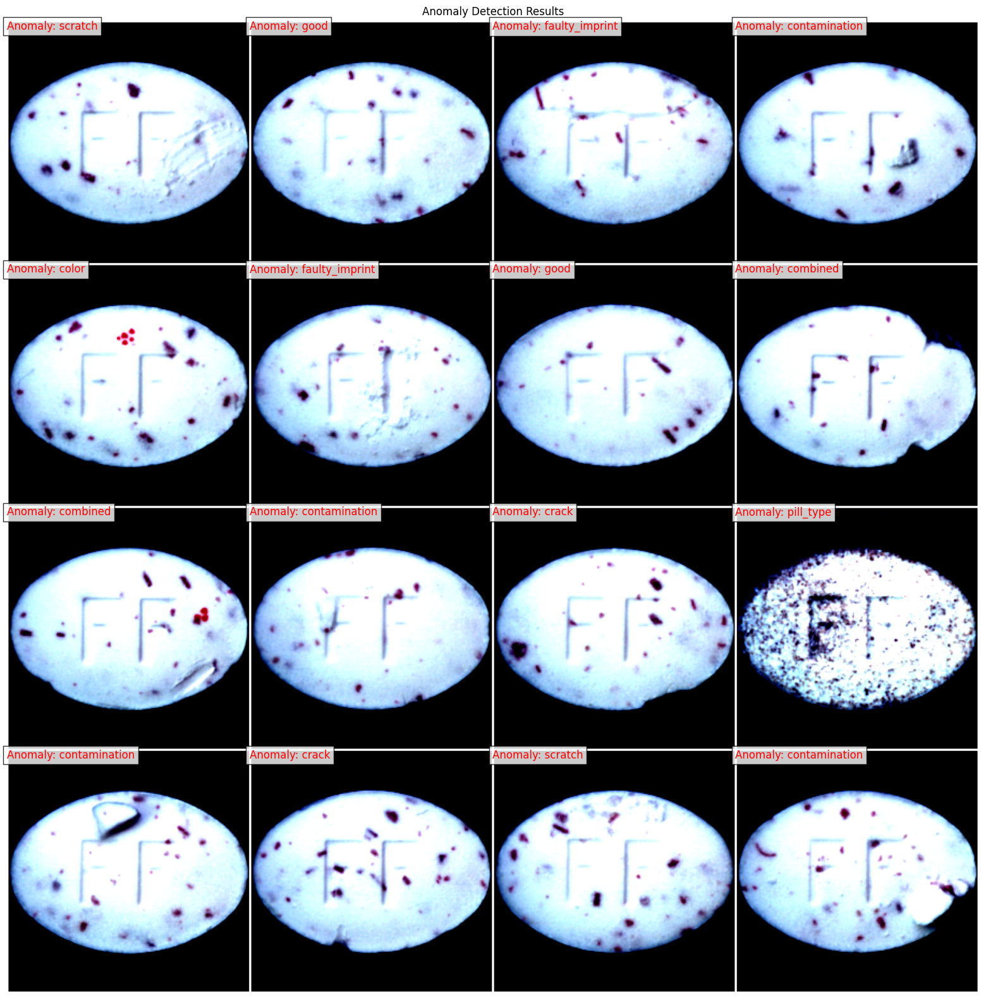

In [16]:
import matplotlib.pyplot as plt
import torchvision
from torchvision.utils import make_grid

def show_images(loader, nrow=4):
    """
    データローダーから画像を取得し、アノマリーラベルを表示する関数

    Args:
        loader (dict): バッチデータが含まれる辞書
        nrow (int): グリッドの列数
    """
    images = loader['image']
    anomalies = loader['anomaly']
    
    grid = make_grid(images, nrow=nrow, pad_value=255)
    plt.figure(figsize=(20, 20))
    plt.imshow(grid.numpy().transpose((1, 2, 0)))
    plt.axis('off')
    
    # 画像のサイズ
    img_height = images.shape[2]
    img_width = images.shape[3]

    # グリッド内の画像位置を計算
    for i, anomaly in enumerate(anomalies):
        row = i // nrow
        col = i % nrow
        x = col * (img_width + 2)  # パディングスペースを含む
        y = row * (img_height + 2)
        
        plt.text(
            x, y, f'Anomaly: {anomaly}', color='red', fontsize=12,
            verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8)
        )

    plt.title('Anomaly Detection Results')
    plt.show()

# test画像を表示
test_batch = next(iter(test_dataloader))
show_images(test_batch)


In [4]:
# ダウンサンプリングの割合を指定
downsample_ratio = 0.1  # 例えば、10%を使用する

# ダウンサンプリング
dataset_size = len(train_dataset)
if dataset_size == 0:
    raise ValueError("The training dataset is empty.")

indices = list(range(dataset_size))
np.random.shuffle(indices)
downsampled_size = int(dataset_size * downsample_ratio)
downsampled_indices = indices[:downsampled_size]

downsampled_train_dataset = Subset(train_dataset, downsampled_indices)

train_dataloader = DataLoader(
    downsampled_train_dataset,
    batch_size=batch_size,
    shuffle=True,  # トレーニングデータをシャッフル
    num_workers=num_workers,
    pin_memory=True
)

In [28]:
test_batch['image']

tensor([[[[-1.8439, -1.8268, -1.8439,  ..., -1.8439, -1.8439, -1.8610],
          [-1.8439, -1.8439, -1.8439,  ..., -1.8610, -1.8439, -1.8610],
          [-1.8610, -1.8439, -1.8439,  ..., -1.8610, -1.8439, -1.8610],
          ...,
          [-1.8268, -1.8439, -1.8439,  ..., -1.8610, -1.8610, -1.8610],
          [-1.8268, -1.8439, -1.8268,  ..., -1.8439, -1.8439, -1.8610],
          [-1.8097, -1.8268, -1.8268,  ..., -1.8439, -1.8782, -1.8610]],

         [[-1.7556, -1.7381, -1.7556,  ..., -1.7556, -1.7556, -1.7556],
          [-1.7556, -1.7556, -1.7556,  ..., -1.7556, -1.7556, -1.7731],
          [-1.7556, -1.7556, -1.7556,  ..., -1.7731, -1.7731, -1.7731],
          ...,
          [-1.7556, -1.7731, -1.7731,  ..., -1.7556, -1.7731, -1.7556],
          [-1.7381, -1.7556, -1.7556,  ..., -1.7556, -1.7556, -1.7556],
          [-1.7381, -1.7556, -1.7556,  ..., -1.7556, -1.7731, -1.7731]],

         [[-1.2990, -1.2816, -1.3164,  ..., -1.3339, -1.3339, -1.3513],
          [-1.2990, -1.2990, -

In [34]:
test_batch['image'].shape

torch.Size([16, 3, 224, 224])

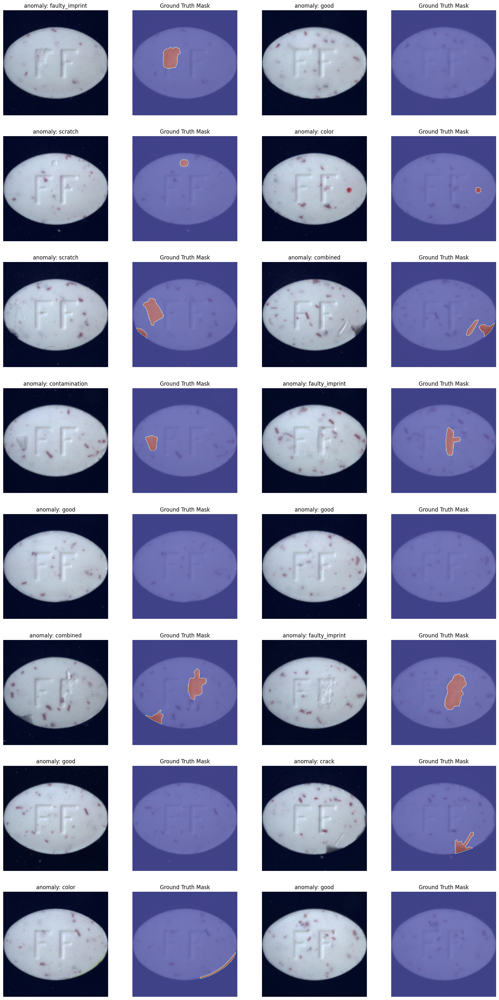

In [50]:
import matplotlib.pyplot as plt
import torch

# 値を[0, 1]に正規化する関数
def normalize_image(image):
    """
    画像を正規化する関数

    Args:
        image (Tensor): 正規化する画像

    Returns:
        Tensor: 正規化された画像
    """
    image_min = image.min()
    image_max = image.max()
    # 0で割ることを防ぐ
    if image_max == image_min:
        return image
    return (image - image_min) / (image_max - image_min)

def show_test_images(loader, num_images=4):
    """
    データローダーから画像を取得し、元画像、予測マスク、実際のマスクを表示する関数

    Args:
        loader (dict): バッチデータが含まれる辞書
        num_images (int): 表示する画像の数
    """
    images = loader['image']
    anomalies = loader['anomaly']
    masks_gt = loader['mask']
    num_images = int(num_images / 2)
    
    fig, axes = plt.subplots(num_images, 4, figsize=(20, 5 * num_images))
    
    for i in range(num_images):
        image = images[i].permute(1, 2, 0).numpy()
        gt_mask = masks_gt[i].numpy()[0]

        image = normalize_image(image)
        gt_mask = normalize_image(gt_mask)
        
        # Show original images
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f'anomaly: {anomalies[i]}')
        axes[i, 0].axis('off')
        
        # Show ground truth masks with original image
        axes[i, 1].imshow(image, alpha=0.5)
        axes[i, 1].imshow(gt_mask, cmap='jet', alpha=0.5)
        axes[i, 1].set_title('Ground Truth Mask')
        axes[i, 1].axis('off')
        
        # If there is a second image and mask in the batch
        if i + num_images < len(images):
            image_b = images[i + num_images].permute(1, 2, 0).numpy()
            gt_mask_b = masks_gt[i + num_images].numpy()[0]

            image_b = normalize_image(image_b)
            gt_mask_b = normalize_image(gt_mask_b)
            
            # Show second original image
            axes[i, 2].imshow(image_b)
            axes[i, 2].set_title(f'anomaly: {anomalies[i + num_images]}')
            axes[i, 2].axis('off')
            
            # Show second ground truth mask with original image
            axes[i, 3].imshow(image_b, alpha=0.5)
            axes[i, 3].imshow(gt_mask_b, cmap='jet', alpha=0.5)
            axes[i, 3].set_title('Ground Truth Mask')
            axes[i, 3].axis('off')
    
    plt.show()

# test画像を表示
test_batch = next(iter(test_dataloader))
show_test_images(test_batch, num_images=16)

In [7]:
# PatchCoreの学習
patchcore_instance.fit(train_dataloader)

In [8]:
# PatchCoreによる予測
# scores : 予測した異常スコア
# segmentations : 予測した異常マスク
# labels_gt : 正解ラベル
# masks_gt : 正解マスク
pred_scores, pred_masks, labels_gt, masks_gt = patchcore_instance.predict(test_dataloader)

/tmp/ipykernel_185509/378947925.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  masks_gt = torch.tensor(masks_gt).float()
/tmp/ipykernel_185509/320704468.py:8: RuntimeWarning: invalid value encountered in divide
  return (image - image.min()) / (image.max() - image.min())


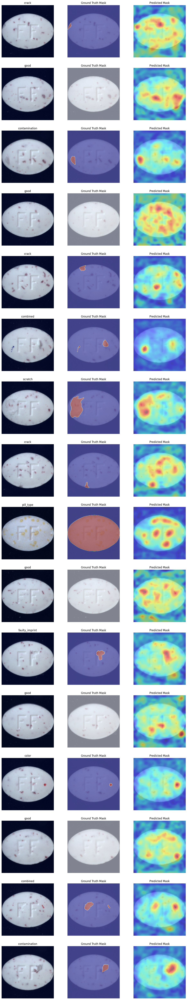

In [49]:
import torch.utils


def show_images(loader, segmentations, masks_gt, num_images=4):
    """
    データローダーから画像を取得し、元画像、予測マスク、実際のマスクを表示する関数

    Args:
        loader (dict): バッチデータが含まれる辞書
        segmentations (list): 予測されたマスク
        masks_gt (list): 実際のマスク
        num_images (int): 表示する画像の数
    """
    images = loader['image']
    anomalies = loader['anomaly']
    
    segmentations = torch.tensor(segmentations).float()
    masks_gt = torch.tensor(masks_gt).float()
    
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    
    for i in range(num_images):
        image = images[i].permute(1, 2, 0).numpy()
        pred_mask = segmentations[i].numpy()
        gt_mask = masks_gt[i].numpy()[0]

        image = normalize_image(image)
        pred_mask = normalize_image(pred_mask)
        gt_mask = normalize_image(gt_mask)
        
        # Show original images
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f'{anomalies[i]}')
        axes[i, 0].axis('off')
        
        # Show ground truth masks with original image
        axes[i, 1].imshow(image, alpha=0.5)
        axes[i, 1].imshow(gt_mask, cmap='jet', alpha=0.5)
        axes[i, 1].set_title('Ground Truth Mask')
        axes[i, 1].axis('off')
        
        # Show predicted masks with original image
        axes[i, 2].imshow(image, alpha=0.5)
        axes[i, 2].imshow(pred_mask, cmap='jet', alpha=0.5)
        axes[i, 2].set_title('Predicted Mask')
        axes[i, 2].axis('off')
    
    plt.show()

# test画像を表示
test_batch = next(iter(test_dataloader))
images = test_batch['image']

# データローダーを作成
batch_loader = torch.utils.data.DataLoader(images, batch_size=batch_size, shuffle=False)
pred_scores, pred_masks, _, mask_gt = patchcore_instance.predict(batch_loader)
show_images(test_batch, pred_masks, masks_gt, num_images=16)

/tmp/ipykernel_185509/320704468.py:8: RuntimeWarning: invalid value encountered in divide
  return (image - image.min()) / (image.max() - image.min())


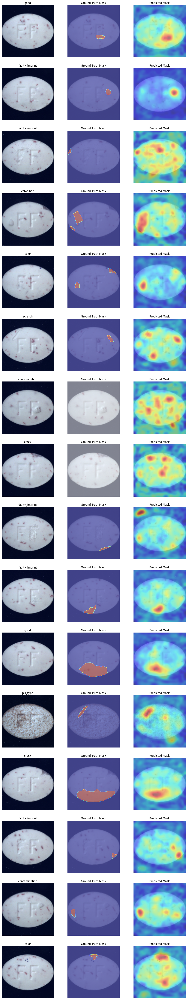

In [51]:
import matplotlib.pyplot as plt
import torch

def normalize_image(image):
    """
    画像を正規化する関数
    """
    return (image - image.min()) / (image.max() - image.min())

def show_images(images, anomalies, pred_masks, masks_gt, num_images=4):
    """
    データローダーから画像を取得し、元画像、予測マスク、実際のマスクを表示する関数

    Args:
        images (torch.Tensor): バッチデータが含まれる辞書
        anomalies (torch.Tensor): アノマリーラベル
        pred_masks (list): 予測されたマスク
        masks_gt (list): 実際のマスク
        num_images (int): 表示する画像の数
    """
    pred_masks = torch.tensor(pred_masks).float()
    masks_gt = torch.tensor(masks_gt).float()
    
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    
    for i in range(num_images):
        image = images[i].permute(1, 2, 0).numpy()
        pred_mask = pred_masks[i].numpy()
        gt_mask = masks_gt[i].numpy()[0]

        image = normalize_image(image)
        pred_mask = normalize_image(pred_mask)
        gt_mask = normalize_image(gt_mask)
        
        # Show original images
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f'{anomalies[i]}')
        axes[i, 0].axis('off')
        
        # Show ground truth masks with original image
        axes[i, 1].imshow(image, alpha=0.5)
        axes[i, 1].imshow(gt_mask, cmap='jet', alpha=0.5)
        axes[i, 1].set_title('Ground Truth Mask')
        axes[i, 1].axis('off')
        
        # Show predicted masks with original image
        axes[i, 2].imshow(image, alpha=0.5)
        axes[i, 2].imshow(pred_mask, cmap='jet', alpha=0.5)
        axes[i, 2].set_title('Predicted Mask')
        axes[i, 2].axis('off')
    
    plt.show()

# PatchCoreによる予測
pred_scores, pred_masks, labels_gt, masks_gt = patchcore_instance.predict(test_dataloader)

# test画像を表示
test_batch = next(iter(test_dataloader))
images = test_batch['image']
anomalies = test_batch['anomaly']

show_images(images, anomalies, pred_masks, masks_gt, num_images=16)
